# Shallow water equation of 1d
$\frac{\partial u}{\partial t} + u\frac{\partial u}{\partial x} + g \frac{\partial h}{\partial t} = 0,
\frac{\partial h}{\partial t} + \frac{\partial (uh)}{\partial x} = 0
$

${\displaystyle {\begin{aligned}{\frac {\partial h}{\partial t}}&+{\frac {\partial }{\partial x}}{\Bigl (}(H+h)u{\Bigr )}+{\frac {\partial }{\partial y}}{\Bigl (}(H+h)v{\Bigr )}=0,\\[3pt]{\frac {\partial u}{\partial t}}&+u{\frac {\partial u}{\partial x}}+v{\frac {\partial u}{\partial y}}-fv=-g{\frac {\partial h}{\partial x}}-ku+\nu \left({\frac {\partial ^{2}u}{\partial x^{2}}}+{\frac {\partial ^{2}u}{\partial y^{2}}}\right),\\[3pt]{\frac {\partial v}{\partial t}}&+u{\frac {\partial v}{\partial x}}+v{\frac {\partial v}{\partial y}}+fu=-g{\frac {\partial h}{\partial y}}-kv+\nu \left({\frac {\partial ^{2}v}{\partial x^{2}}}+{\frac {\partial ^{2}v}{\partial y^{2}}}\right),\end{aligned}}}$  
from wikipedia [shallow water equation](https://en.wikipedia.org/wiki/Shallow_water_equations)

In [4]:
import numpy as np

In [56]:
L_x = 1e3
g = 9.81
h = 100
N_x = 150
x = np.linspace(-L_x/2, L_x/2, N_x)


# Step 1 - 1-D Linear Convection

# Shallow water equation of 1d
$\frac{\partial u}{\partial t} + c\frac{\partial u}{\partial x} = 0
$

초기함수의 전파에 대한것을 나타내며, 속도 c로 전파된다.  
시간에 대한 미분은 구하려는 시간에서 뒤의 시간을 빼는 방법을 사용하며, 공간에 대한 미분은 바로 이전의 위치를 이용해서 미분하는 전략을 사용한다.  

[Baragroup cdf step 1](https://nbviewer.org/github/barbagroup/CFDPython/blob/master/lessons/01_Step_1.ipynb)


In [2]:
import numpy as np                
import matplotlib.pyplot as plt     
import time, sys    

In [16]:
nx = 301         # x에 대한 미분을 충당하기 위해서 설정했다.
ranx = 30
dx = ranx/(nx-1)
nt = 2010
dt = 0.025       #
c  = 0.5          # 파도의 속도를 1로 해서 계산한다.
g  = 9.81
err = 1e-8

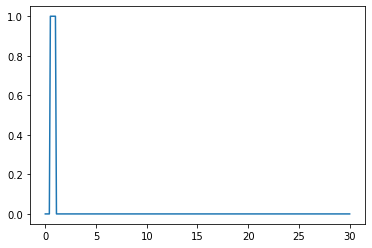

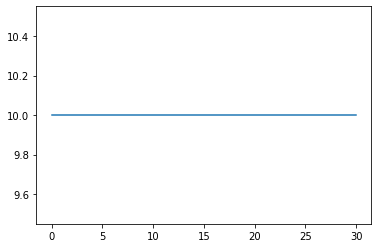

In [42]:
u = np.zeros(nx) + err
h = 10*np.ones(nx)
u[int(.5/dx):int(1/dx+1)] = 1
# print(u)
figu, axu = plt.subplots(1, 1)
axu.plot(np.linspace(0,ranx,nx),u)
figh, axh = plt.subplots(1, 1)
axh.plot(np.linspace(0,ranx,nx),h)

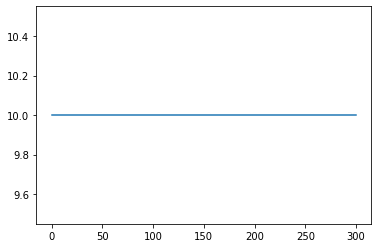

In [25]:
plt.plot(h)

$u_i^{n+1} = u_i^n - c\frac{\Delta t}{\Delta x} (u_i^n - u_{i-1}^n)$

$h_i^{n+1} = h_i^n - \frac{\Delta t}{\Delta x} (h_i^n*u_i^n - h_{i-1}^n *u_{i-1}^n)$

In [26]:
ulist = []
hlist = []
un = np.zeros(nx) + err#initialize a temporary array
hn = np.ones(nx)*10
for n in range(nt):  #loop for values of n from 0 to nt, so it will run nt times
    un = u.copy() 
    hn = h.copy()
    for i in range(1, nx): ## you can try commenting this line and...
    #for i in range(nx): ## ... uncommenting this line and see what happens!
        u[i] = un[i] - c * dt / dx * (un[i] - un[i-1])
        h[i] = hn[i] - dt / dx * (hn[i]*un[i] - hn[i-1]*un[i-1])
        
    ulist.append(un)
    hlist.append(hn)

In [49]:
def update_u(num):
    u = ulist[num*3]
    axu.clear()
    axu.plot(np.linspace(0,ranx,nx),u)
    axu.set_ylim(-0.1,1.1)
def update_h(num):
    h = hlist[num*3]
    axh.clear()
    axh.plot(np.linspace(0,ranx,nx),h)
    axh.set_ylim(-0.1,60)

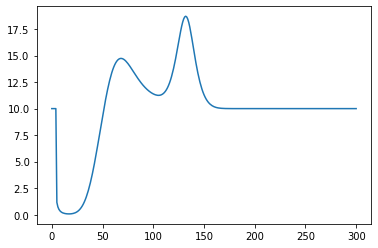

In [34]:
plt.plot(hlist[1000])

In [44]:
from matplotlib import animation
from IPython.display import HTML

In [37]:
nt//10

201

In [50]:
animh = animation.FuncAnimation(figh, update_h,
        frames = nt//3, interval = 10, blit = False)

In [51]:
HTML(animh.to_jshtml())

In [47]:
animu = animation.FuncAnimation(figu, update_u,
        frames = nt//3, interval = 10, blit = False)

In [48]:
HTML(animu.to_jshtml())